In [1]:
# from dask_image.imread import imread
import matplotlib.pyplot as plt
import pims
# import btrack
import trackpy as tp
import numpy as np
import pandas as pd
import napari
import skimage
from skimage.measure import label, regionprops, regionprops_table
from skimage.measure import label, regionprops, regionprops_table
from ipywidgets import interact
from ipywidgets import widgets
# from ipywidgets import interact
import traitlets
from IPython.display import display
from tkinter import Tk, filedialog
import os

def tick_choices(Project,Zstack,append,_ram,sub_back):
    return Project,Zstack,append,_ram,sub_back

class SelectFilesButton(object):
    """A file widget that leverages tkinter.filedialog."""

    def __init__(self):
        super(SelectFilesButton, self).__init__()
        # Add the selected_files trait

        # Create the button.
        self.button = widgets.Button(description = 'Select Files', icon = "square-o")
        self.button.add_traits(files=traitlets.traitlets.List())
        self.button.pick = False
#         self.description = "Select Files"
#         self.icon = "square-o"
        self.button.style.button_color = "orange"
    
        # self.button2 = widgets.Button(description = 'Select Directory', icon = "square-o")
#         self.button2.add_traits(directory=traitlets.traitlets.List())
#         self.description = "Select Files"
#         self.icon = "square-o"
        # self.button2.style.button_color = "orange"
        # self.button2.pick = False
        # Set on click behavior.
        self.button.on_click(self.select_files)
        # self.button2.on_click(self.select_directory)
        display(self.button)
        # display(self.button2)
        
    @staticmethod
    def select_files(b):
        """Generate instance of tkinter.filedialog.

        Parameters
        ----------
        b : obj:
            An instance of ipywidgets.widgets.Button 
        """
        # Create Tk root
        root = Tk()
        # Hide the main window
        root.withdraw()
        # Raise the root to the top of all windows.
        root.call('wm', 'attributes', '.', '-topmost', True)
        # List of selected fileswill be set to b.value
        b.files = filedialog.askopenfilename(multiple=True)
        b.pick = True
        b.description = "Files Selected"
        b.icon = "check-square-o"
        b.style.button_color = "lightgreen"
        
    # @staticmethod
    # def select_directory(c):
    #     """Generate instance of tkinter.filedialog.

    #     Parameters
    #     ----------
    #     c : obj:
    #         An instance of ipywidgets.widgets.Button 
    #     """
    #     # Create Tk root
    #     root = Tk()
    #     # Hide the main window
    #     root.withdraw()
    #     # Raise the root to the top of all windows.
    #     root.call('wm', 'attributes', '.', '-topmost', True)
    #     # List of selected fileswill be set to b.value
    #     c.files = filedialog.askdirectory()
    #     c.pick = True
    #     c.description = "Directory Selected"
    #     c.icon = "check-square-o"
    #     c.style.button_color = "lightgreen"

def make_labels_trackpy_links(image,j,size=5,_round=False):
    import trackpy as tp
    import scipy.ndimage as ndi
    from scipy.ndimage import binary_dilation


    #outputsomehow is 3D, we want 2
    coords = np.dstack((round(j.y),round(j.x)))[0].astype(int)

    #this is super slow
    # ~ masks = tp.masks.mask_image(coords,np.ones(image.shape),size/2)

    #This is faster
    r = (size-1)/2 # Radius of circles
    #make 3D compat
    disk_mask = tp.masks.binary_mask(r,image.ndim)
    # Initialize output array and set the maskcenters as 1s
    out = np.zeros(image.shape,dtype=bool)
    #check if there's a problem with subpixel masking
    out[coords[:,0],coords[:,1]] = 1
    # Use binary dilation to get the desired output
    out = binary_dilation(out,disk_mask)


    labels, nb = ndi.label(out)
    if _round:
        return labels, coords
    else:
        if image.ndim == 2:
            coords = j.loc[:,['particle','frame','y','x']]
#             coords = np.dstack((j.particle,j.y,j.x))[0]
            return labels, coords
#     return labels, coords

def make_masks(positions,r=3,ndims=2):
    import trackpy as tp
    if ndims == 2:
        r = (size-1)/2 # Radius of circles
        #make 3D compat
        disk_mask = tp.masks.binary_mask(r,np.zeros(ndim))
        # Initialize output array and set the maskcenters as 1s
        out = np.zeros(image.shape,dtype=bool)
        #check if there's a problem with subpixel masking
        out[coords[:,0],coords[:,1]] = 1
        # Use binary dilation to get the desired output
        out = binary_dilation(out,disk_mask)
        labels, nb = ndi.label(out)

        if _round:
            return labels, coords
        else:
            if image.ndim == 2:
                coords = np.dstack((f.y,f.x))[0]
                return labels, coords
    elif image.ndim == 3:
            coords = np.dstack((f.z,f.y,f.x))[0]
            return None, coords

my_button = SelectFilesButton()
my_button # This will display the button in the context of Jupyter Notebook

Button(description='Select Files', icon='square-o', style=ButtonStyle(button_color='orange'))

2023-10-12 14:19:25.541 python[16276:269982151] +[CATransaction synchronize] called within transaction


In [2]:
# fname = '/Volumes/HopeLab-4/Users/Mohammad_Anwar_Siddique/Uncoating_Studies/Optimized_LCI_MAS/RNR_Inhibitors_Prospective_Events_QualitativeAssesment/1. Hydroxyurea_HU/Full_Track/December-09-2022/B2_35ul_G500_HU750_1_R3D_D3D_PRJ.dv'
if my_button.button.pick:
    filelist = my_button.button.files

reader = pims.Bioformats(filelist[0])
reader

/Users/mas2868/anaconda3/envs/trackpy/lib/python3.11/site-packages/pims/bioformats.py:410: UserWarning: Due to an issue with JPype 0.6.0, reading is slower. Please consider upgrading JPype to 0.6.1 or later.
  warn('Due to an issue with JPype 0.6.0, reading is slower. '


<FramesSequenceND>
Axes: 4
Axis 'x' size: 480
Axis 'y' size: 480
Axis 'c' size: 3
Axis 't' size: 41
Pixel Datatype: <u2

679.0
597.0
525.0


Frame([[[14268, 14258, 13963, ..., 18302, 12926, 12648],
        [15956, 16488, 13989, ..., 12429, 14523, 17608],
        [15180, 15580, 17095, ..., 14522, 22921, 24684],
        ...,
        [14435, 12287, 16240, ..., 15387, 11411, 10292],
        [11767, 12111, 17696, ...,  8865, 11546,  9186],
        [15519, 14985, 16309, ..., 14155, 10505, 10505]],

       [[16889, 21422, 14975, ..., 23832, 15308, 15802],
        [16812, 23474, 16132, ..., 18608, 19355, 27377],
        [17727, 13184, 17772, ..., 16362, 12550, 14881],
        ...,
        [15813, 14650, 17789, ..., 10630, 11232, 13057],
        [11476, 13395, 13016, ...,  9787, 11281, 11434],
        [10504, 10322, 14909, ..., 15821, 14925, 15106]],

       [[15578, 17210, 13649, ..., 16131, 14335, 13726],
        [19523, 19245, 19980, ..., 19620, 14417, 16842],
        [15520, 17033, 22741, ..., 22324, 12851, 16323],
        ...,
        [17185, 12896, 11778, ..., 12319, 10868, 14148],
        [16364, 12273, 11388, ..., 11708, 11597, 13492],
        [15734, 17414, 13276, ..., 13362, 16376, 15262]],

       ...,

       [[16894, 18172, 15167, ..., 19995, 12446, 14384],
        [15153, 20218, 15868, ..., 11576, 11428, 13211],
        [18805, 14706, 20194, ..., 14560, 12952, 16877],
        ...,
        [14354, 12957, 14915, ..., 11274, 12593, 13099],
        [10629, 10690, 10605, ..., 15810, 11510, 13229],
        [14298, 11243, 13260, ..., 13403, 12920, 13155]],

       [[16845, 16995, 17633, ..., 12667, 11751, 15030],
        [15062, 20099, 20953, ..., 11635, 15862, 12390],
        [15031, 18640, 20468, ..., 13656, 12151, 12671],
        ...,
        [17540, 17857, 13266, ..., 11986,  9798,  9855],
        [15176, 16344, 11251, ..., 16881,  9795, 10172],
        [13265, 13973, 13517, ..., 17428, 10343, 15473]],

       [[14625, 16704, 14315, ..., 13868, 12048, 12619],
        [13585, 15706, 14998, ..., 13407, 13179, 15269],
        [18078, 17012, 14476, ..., 20140, 15342, 16702],
        ...,
        [11651, 15700, 12373, ..., 20992, 12784, 12777],
        [14280, 12024, 14646, ..., 15100, 10644,  9051],
        [10287, 10877, 13530, ..., 14828, 10807, 10627]]], dtype=uint16)
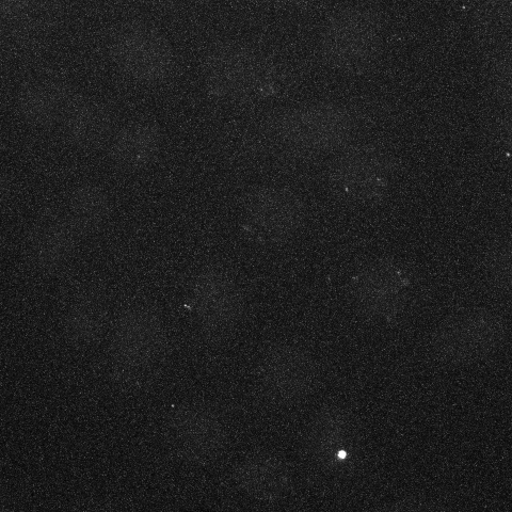
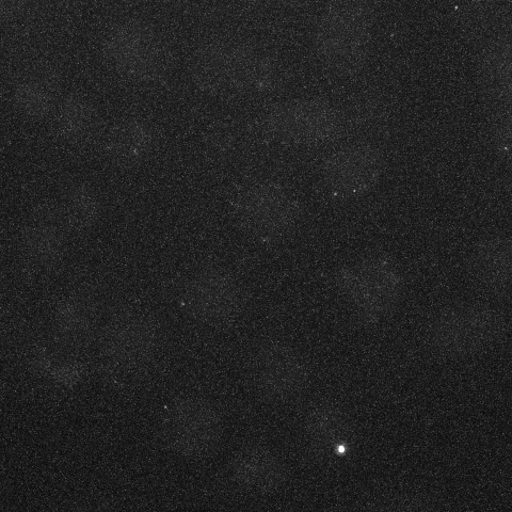
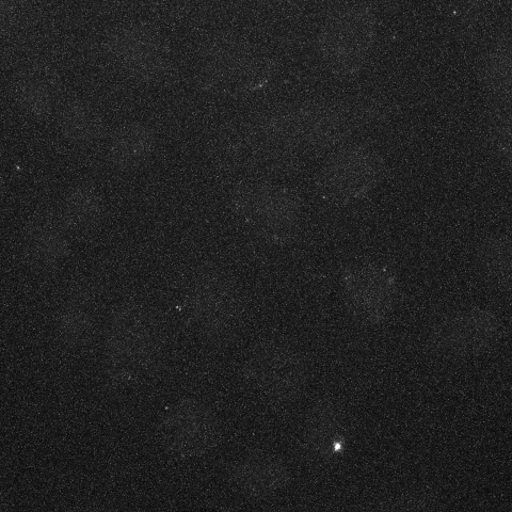
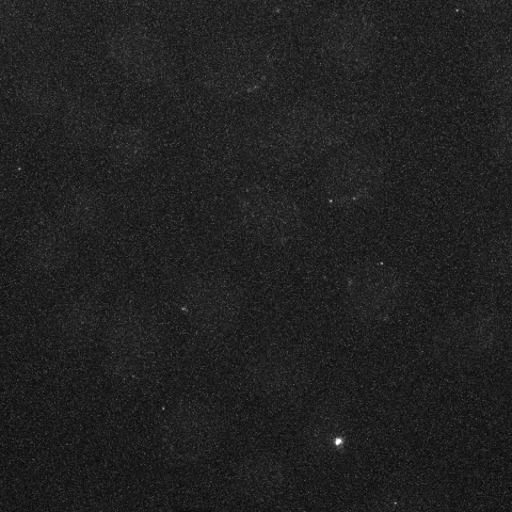
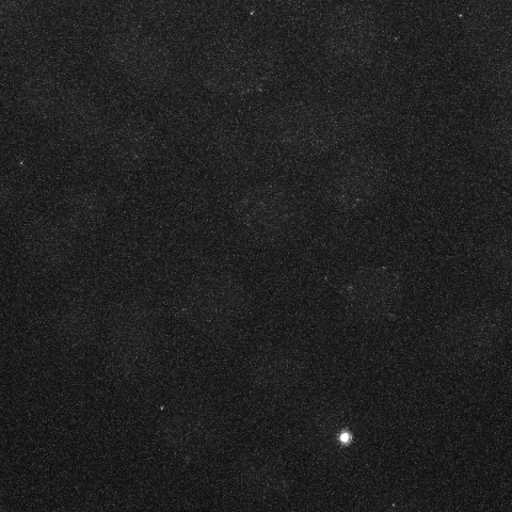
...
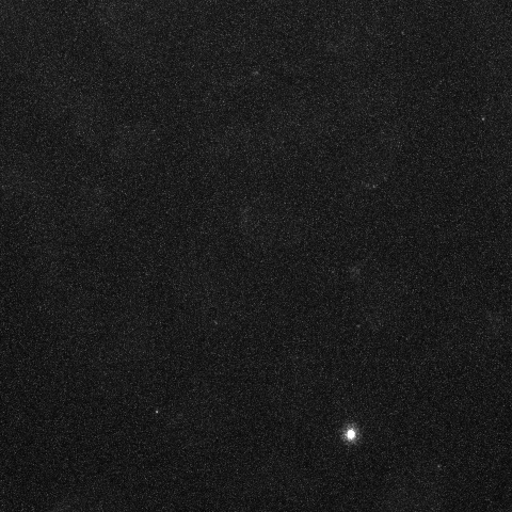
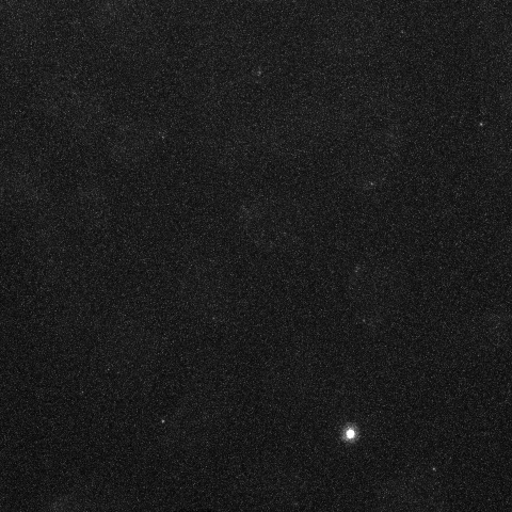
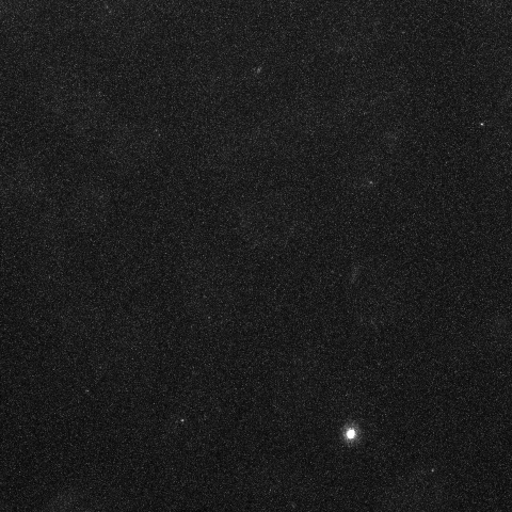
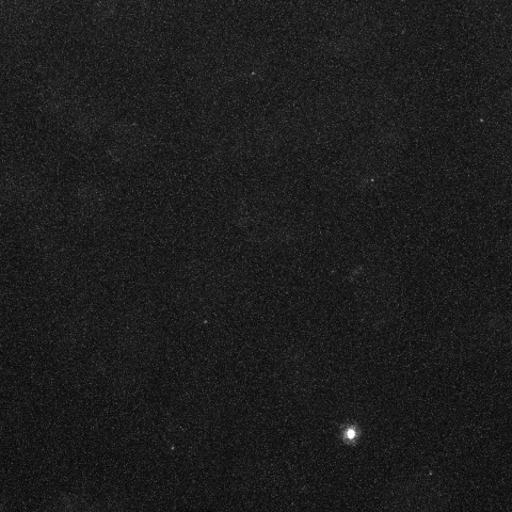
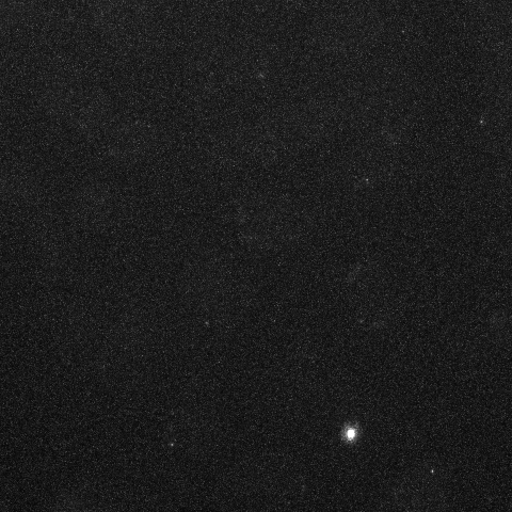

In [3]:
for i in range(reader.metadata.ChannelCount(0)):
    print(reader.metadata.ChannelEmissionWavelength(0,i))
reader.bundle_axes = 'tyx'
reader.iter_axes = 't'
reader.default_coords['c'] = 1
# frames = reader
reader[0]


Frame 40: 7 features


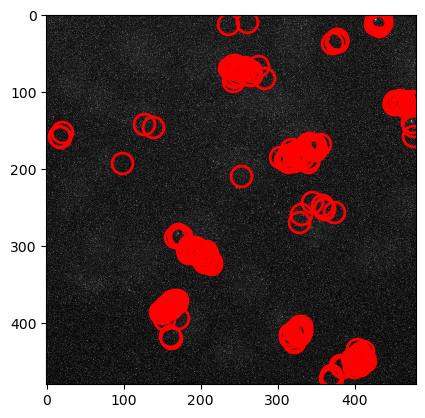

In [4]:
reader.bundle_axes = 'yx'
reader.default_coords['c'] = 1
a = np.array(reader[:])
reader.default_coords['c'] = 2
green = np.array(reader[:])
reader.default_coords['c'] = 0
blue = np.array(reader[:])
# a.shape
reader.default_coords['c'] = 1

_frame = 1 #@param {type:"integer"}
#@markdown ---
#@markdown ### Enter the intensity cut

##mass that joao settelled with was 39500

_mass = 39500 #@param {type:"slider", min:0, max:1e5, step:100}

#@markdown ---
#@markdown ### Enter the diameter of the particle expected
_diam = 7 #@param {type:"slider", min:3, max:19, step:2}

f = tp.batch(a,7,minmass=_mass,
#              processes=-1,
             engine='numba'
            )
# tp.subpx_bias(f)
# plt.hist(f['mass'], bins=20)

f = f[((f['mass'] > _mass) & (f['size'] < 2.25) & (f['mass'] < 4e6)
             &          (f['ecc'] < 0.5)
            )
           ]

i=1
tp.annotate(f, reader[i]);

In [5]:
##If if fails because of number of particles, you need to reduce distance
##standard is 75 pixels
_distance = 100
_mem = 4
links = tp.link(f, search_range=_distance,memory=_mem)
links = tp.filter_stubs(links, 5)
links

Frame 40: 7 trajectories present.


,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame,,,,,,,,,,
0,6.415345,434.330654,65871.809909,1.353021,0.138445,9262.052946,571364.0,0.173363,0,0
0,177.077808,324.504959,69399.366288,1.487397,0.126547,8607.220043,595493.0,0.148951,0,3
0,255.125421,373.371293,51390.147404,1.486781,0.202813,6455.469784,563501.0,0.183144,0,4
0,286.357535,174.016166,82111.008886,1.608043,0.425776,10773.205800,631590.0,0.123034,0,5
0,379.947404,161.552716,68052.031164,1.296987,0.233203,10326.211166,514086.0,0.283756,0,6
...,...,...,...,...,...,...,...,...,...,...
40,416.396253,160.680241,60022.266731,1.424574,0.205838,8329.296398,539863.0,0.171140,40,6
40,113.809285,450.936807,55599.527421,1.366468,0.066434,8125.712651,572337.0,0.137223,40,14
40,70.339879,244.355014,40664.509561,1.707316,0.261553,3997.430691,573985.0,0.135857,40,9


In [6]:
# i = 5
# print(make_labels_trackpy_links(a[i],links[links['frame'] ==i],size=3)[0].max())
# print(len(links[links['frame'] ==i].index))


####YAY WORKS!!!
masks = np.zeros(a.shape).astype('int64')
idx = []
# links.loc[:,['particle','frame','y','x']]
for i in links.frame.unique():

    temp = links[links['frame'] == i].sort_values(by=['y'])
    #0 returns mask, 1 index returns coords
    mask_temp, idx_temp = make_labels_trackpy_links(a[i],temp,size=5)
#     print(mask_temp.max(),len(temp.index))
#     idx.append(idx_temp)
    mask_fixed = np.copy(mask_temp)
    for j in np.unique(mask_temp).astype('int'):
        if j != 0:
            mask_fixed[mask_temp == j] = temp.iloc[j-1]['particle'].astype('int')
#     print(np.unique(mask_fixed),temp['particle'].unique())
    masks[i,...] = mask_fixed
    
###visualize stuff
_points = f.loc[:,['frame','y','x']]
_metadata = f.loc[:,['mass','size','ecc']]

points_options = dict(face_color=[0]*4,edge_color='red',opacity=0.5,size=5)
v = napari.Viewer()
v.add_image(a,colormap='red',name='mRuby3-IN',blending='additive')
v.add_image(green,colormap='green',name='IGFP',blending='additive')
v.add_image(blue,colormap='blue',name='Nucspot650',blending='additive')
v.add_points(  f.loc[:,['frame','y','x']],properties=_metadata,**points_options)

# nuclei_spots =  df_all.loc[:,['t','y','x']]
v.add_labels(masks)
v.add_tracks(links.loc[:,['particle','frame','y','x']],name='trackpy')



# links.loc[[:,columns=]]
# f.loc[:,['mass','size','ecc']]
# v.add_tracks(data,name='btrack')

<Tracks layer 'trackpy' at 0x26c81c9d0>

Done!


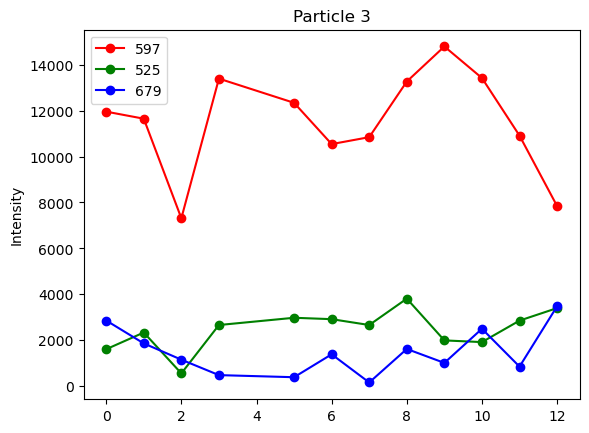

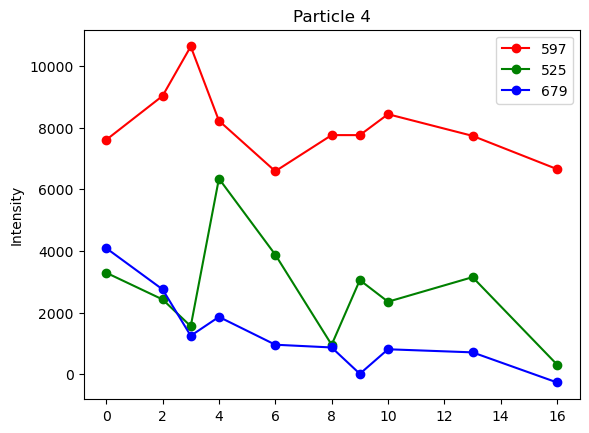

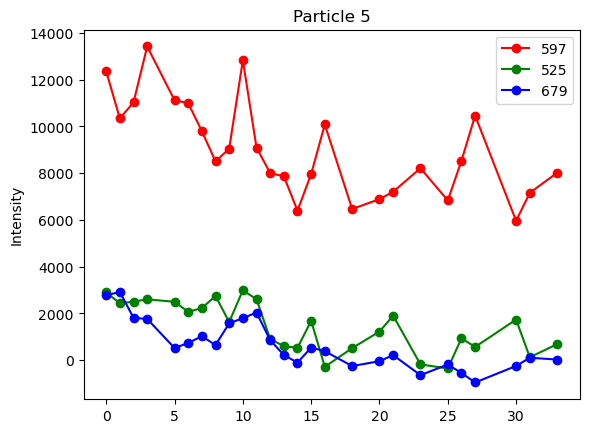

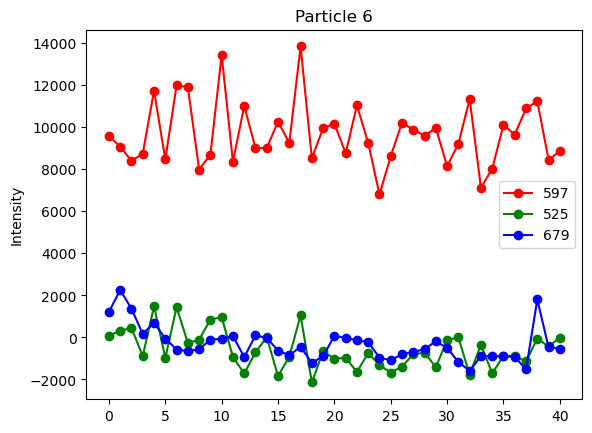

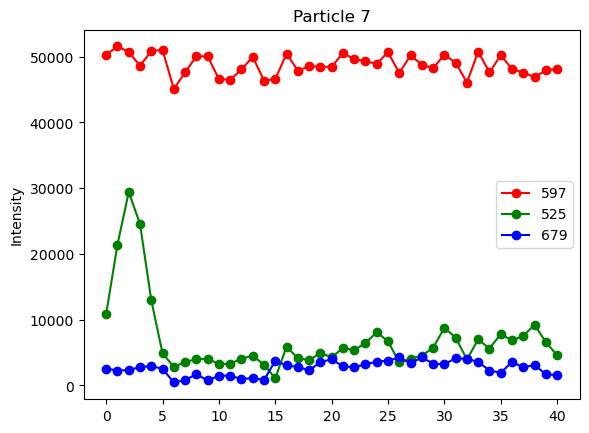

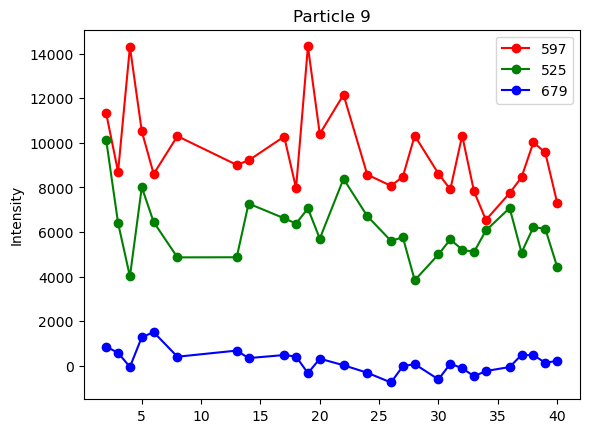

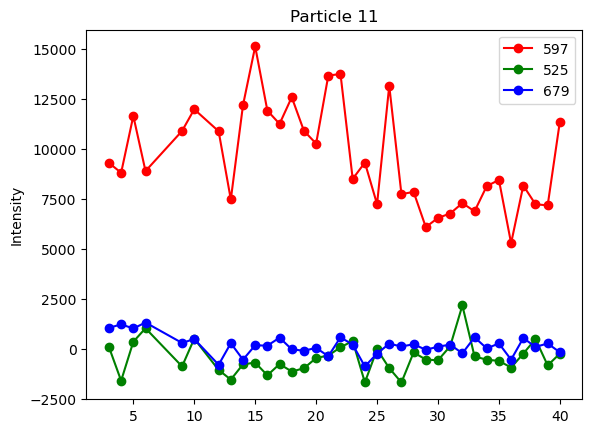

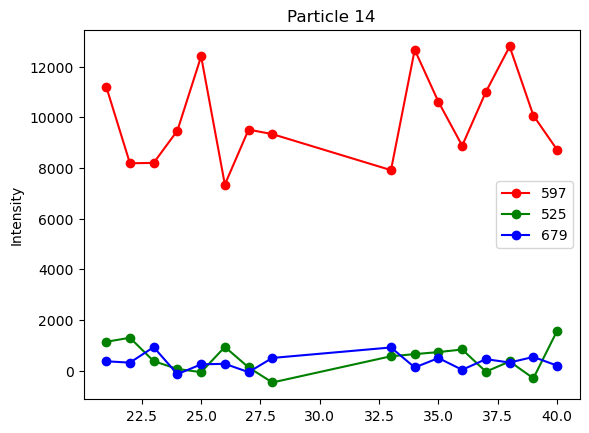

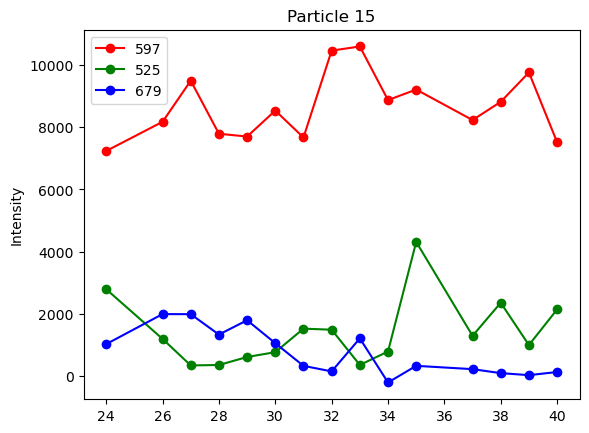

In [7]:
backgrounds = {}

for i, clr in enumerate([679,597,525]):
    reader.default_coords['c'] = i
    backgrounds[clr] = np.mean(reader[:])

    
df = pd.DataFrame()
rgb = np.stack([a,green,blue])
for i in range(masks.shape[0]):
    df_clr = pd.DataFrame()
    for color in range(rgb.shape[0]):
        df_one = pd.DataFrame.from_dict(regionprops_table(masks[i,...],rgb[color,i,...],  
                                        properties= (
                                # 'perimeter',
                                'label',
    #                             'eccentricity',
    #                             'image_intensity',
                                'intensity_mean',
                                'intensity_max',
                                'intensity_min',
    #                             'area',
    #                             'centroid',
    #                             'orientation',
    #                             'axis_major_length',
    #                             'axis_minor_length',
                                # 'feret_diameter_max',
    #                             'solidity',
                                        )
                                                              ))
        
        ##ORDER IS RGB not experiment!
        if color == 0:
#             df_one['color'] = int(reader.metadata.ChannelEmissionWavelength(0,color))
            df_one['color'] = 597
            df_one['intensity_mean_noBackground'] = df_one['intensity_mean'] - backgrounds[597]
            df_one['intensity_max_noBackground'] = df_one['intensity_max'] - backgrounds[597]
        elif color == 1:
            df_one['color'] = 525
            df_one['intensity_mean_noBackground'] = df_one['intensity_mean'] - backgrounds[525]
            df_one['intensity_max_noBackground'] = df_one['intensity_max'] - backgrounds[525]
        elif color == 2:
            df_one['color'] = 679
            df_one['intensity_mean_noBackground'] = df_one['intensity_mean'] - backgrounds[679]
            df_one['intensity_max_noBackground'] = df_one['intensity_max'] - backgrounds[679]
        
        df_clr = pd.concat([df_clr,df_one])
        

    df_clr['frame'] = i
    df = pd.concat([df,df_clr])
df['mass_threshold'] = _mass
df['diameter'] = _diam
df.to_csv(os.path.dirname(filelist[0])+'/'+os.path.splitext(os.path.basename(filelist[0]))[0]+'.csv')

%matplotlib inline
plot_clr = {679:'blue',597:'red',525:'green'}
for particle in df.label.unique():
    plt.figure()
    for i,clr in enumerate(df.color.unique()):
#         print(clr)
        
        with plt.rc_context({'figure.facecolor':'white'}):
            plt.title('Particle '+str(particle))
            plt.ylabel('Intensity')
            df1 = df[df['label'] == particle]
            subtract = backgrounds[clr]
            plt.plot(df1[df1['color'] == clr].frame,df1[df1['color'] == clr].intensity_mean - subtract,
                     marker='o',label=clr,color=plot_clr[clr])
            plt.legend()
    plt.savefig(os.path.dirname(filelist[0])+'/'+os.path.splitext(os.path.basename(filelist[0]))[0]+'_'+str(particle)+'.png')
#     plt.close()
print("Done!") 

In [8]:
links

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame,,,,,,,,,,
0,6.415345,434.330654,65871.809909,1.353021,0.138445,9262.052946,571364.0,0.173363,0,0
0,177.077808,324.504959,69399.366288,1.487397,0.126547,8607.220043,595493.0,0.148951,0,3
0,255.125421,373.371293,51390.147404,1.486781,0.202813,6455.469784,563501.0,0.183144,0,4
0,286.357535,174.016166,82111.008886,1.608043,0.425776,10773.205800,631590.0,0.123034,0,5
0,379.947404,161.552716,68052.031164,1.296987,0.233203,10326.211166,514086.0,0.283756,0,6
...,...,...,...,...,...,...,...,...,...,...
40,416.396253,160.680241,60022.266731,1.424574,0.205838,8329.296398,539863.0,0.171140,40,6
40,113.809285,450.936807,55599.527421,1.366468,0.066434,8125.712651,572337.0,0.137223,40,14
40,70.339879,244.355014,40664.509561,1.707316,0.261553,3997.430691,573985.0,0.135857,40,9


In [9]:
df

,label,intensity_mean,intensity_max,intensity_min,color,intensity_mean_noBackground,intensity_max_noBackground,frame,mass_threshold,diameter
0,3,25931.384615,35292.0,13634.0,597,11956.423145,21317.03853,0,39500,7
1,4,21576.230769,38729.0,13327.0,597,7601.269299,24754.03853,0,39500,7
2,5,26331.538462,53248.0,12491.0,597,12356.576992,39273.03853,0,39500,7
3,6,23550.230769,43718.0,12692.0,597,9575.269299,29743.03853,0,39500,7
4,7,64288.076923,65535.0,49325.0,597,50313.115453,51560.03853,0,39500,7
...,...,...,...,...,...,...,...,...,...,...
1,7,5240.230769,6549.0,4167.0,679,1564.704309,2873.47354,40,39500,7
2,9,3890.153846,6012.0,2210.0,679,214.627386,2336.47354,40,39500,7
3,11,3504.615385,4572.0,2776.0,679,-170.911076,896.47354,40,39500,7
4,14,3875.307692,5891.0,3033.0,679,199.781232,2215.47354,40,39500,7
